In [1]:
# Se realiza instalcion de dependencias

!pip install ydata-profiling plotly kaggle -q

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 1.4 MB/s eta 0:00:00


In [2]:
!pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 4.3 MB/s eta 0:00:00


In [3]:
# Se realiza instalcion e importacion de librerias

# Manejo de datos
import pandas as pd
import numpy as np

# Visualización de datos
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Analisis profundo de datos
from ydata_profiling import ProfileReport

#Entrenamiento del modelo
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error,classification_report, confusion_matrix
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, FunctionTransformer
from sklearn.linear_model import Lasso, Ridge
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.compose import ColumnTransformer, make_column_selector

#Librerías de Keras y Tensor Flow
import keras
import tensorflow as tf
import keras_tuner as kt
from keras.models import Sequential
from keras.layers import Dense, Input
from keras.utils import plot_model

#Nltk
import nltk
from nltk import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

#Otras librerías
from wordcloud import WordCloud, STOPWORDS
import unicodedata, re
import inflect
import joblib

from datetime import datetime

In [4]:
#Porcentaje para validación y test
test_val_alpha = 0.2
#random_state o semilla para la reproducibilidad
my_seed = 19
#En el entorno de Keras definimos la semilla también
keras.utils.set_random_seed(my_seed)

In [5]:
# Importar base de datos
data1 = pd.read_csv(f"TS1.csv",sep=",")
data2 = pd.read_csv(f"TS2.csv",sep=",")
data3 = pd.read_csv(f"TS3.csv",sep=",")
data4 = pd.read_csv(f"TS4.csv",sep=",")
data5 = pd.read_csv(f"TS5.csv",sep=",")

data = pd.concat([data1,data2,data3,data4,data5])
# Dividir el conjunto de datos en entrenamiento y prueba
train, test = train_test_split(data, test_size=test_val_alpha, random_state=my_seed)
val, test = train_test_split(test, test_size=0.5, random_state=my_seed)

In [6]:
train

,minute,class,TVC,MQ135,MQ136,MQ2,MQ3,MQ4,MQ5,MQ6,MQ8,MQ9,Humidity,Temperature
874,875,good,3.694548,5.17,2.16,2.76,5.60,3.93,3.17,8.31,4.49,5.36,91.7,33.5
798,799,good,3.670143,7.33,70.91,3.70,9.74,21.49,6.79,10.00,3.54,10.17,93.2,33.9
1166,1167,acceptable,4.912012,5.71,2.21,3.04,7.46,7.04,4.31,10.71,2.50,6.08,63.4,31.5
1197,1198,acceptable,4.973564,4.82,1.93,2.39,5.70,1.89,72.94,64.47,4.31,4.25,80.7,38.5
1023,1024,acceptable,4.883239,6.47,69.03,3.49,9.94,21.39,5.79,10.29,2.81,9.40,93.7,33.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2132,2133,spoiled,4.902048,5.19,13.25,2.65,5.89,0.96,2.53,6.02,3.13,7.97,99.9,34.3
1043,1044,acceptable,4.925492,4.88,2.03,2.42,6.01,2.73,72.94,64.47,7.55,4.39,77.5,38.8
712,713,good,3.584916,6.18,2.50,2.84,7.34,11.75,3.65,10.84,18.47,5.29,85.5,34.1
1378,1379,spoiled,5.039323,4.65,1.94,2.39,5.65,1.68,72.24,62.53,3.42,3.99,82.0,37.9


In [ ]:
# Generar un informe de perfil para el conjunto de entrenamiento
train.profile_report(html={'style':{'full_width':True}})

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 14/14 [00:00<00:00, 73.69it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
drop_fields = ["minute"]
target_feature = 'class'

In [8]:
# Preprocess
def preprocess(df):
  df = df.drop_duplicates() # Eliminamos duplicados
  df = df.drop(drop_fields, axis = 1) # Eliminamos columnas que no vamos a usar
  class_labels = {'excellent': 1, 'good': 2, 'acceptable': 3, 'spoiled': 4}
  df['class'] = df['class'].replace(class_labels)
  X_data, y_variable = df.drop([target_feature], axis=1), df[target_feature]
  return X_data, y_variable

In [9]:
def timer(start_time=None):
  if not start_time:
    start_time = datetime.now()
    return start_time
  elif start_time:
    thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
    tmin, tsec = divmod(temp_sec, 60)
    print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [10]:
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues,size=(4, 4)):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    fig, ax = plt.subplots(figsize=size)
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

In [11]:
X_Train, Y_Train = preprocess(train)
X_Val, Y_Val = preprocess(val)
X_Test, Y_Test = preprocess(test)

<ipython-input-8-169799506f77>:6: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['class'] = df['class'].replace(class_labels)
<ipython-input-8-169799506f77>:6: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['class'] = df['class'].replace(class_labels)
<ipython-input-8-169799506f77>:6: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.n

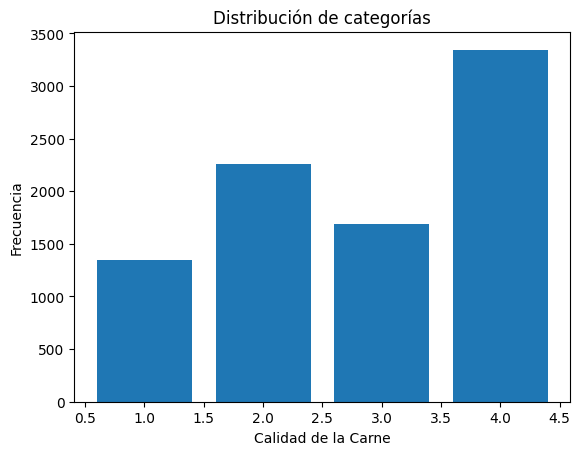

In [12]:
unique, counts = np.unique(Y_Train, return_counts=True)
plt.bar(unique, counts)
plt.xlabel('Calidad de la Carne')
plt.ylabel('Frecuencia')
plt.title('Distribución de categorías')
plt.show()

In [13]:
Y_Train = pd.get_dummies(Y_Train)
Y_Val = pd.get_dummies(Y_Val)
Y_Test = pd.get_dummies(Y_Test)

Y_Train

,1,2,3,4
874,False,True,False,False
798,False,True,False,False
1166,False,False,True,False
1197,False,False,True,False
1023,False,False,True,False
...,...,...,...,...
2132,False,False,False,True
1043,False,False,True,False
712,False,True,False,False
1378,False,False,False,True


In [ ]:
# num_transformer = Pipeline(
#     steps=[
#         ('scaler', 'passthrough')
#     ]
# )

# cat_transformer = Pipeline(
#     steps=[
#         ('imputer', 'passthrough')
#     ]
# )

# preprocessor = ColumnTransformer(
#     transformers=[
#         ("num", num_transformer, make_column_selector(dtype_include=np.number)),
#         ("cat", cat_transformer, make_column_selector(dtype_include=object))
#     ]
# )

# pipe = Pipeline(steps=[
#     ('column_transformer', preprocessor)
# ])

# pipe
# pipe.fit_transform(X_Train)

In [ ]:
X_Train.shape

(8640, 12)

In [14]:
mlp = Sequential()

In [15]:
INPUT_SHAPE = (12, )

In [16]:
mlp.add(Input(shape=INPUT_SHAPE, name='Capa_Entrada'))
mlp.add(Dense(8, activation='relu', name='Capa_Oculta'))
mlp.add(Dense(4, activation='softmax', name='Capa_Salida'))

In [17]:
mlp.compile(loss='categorical_crossentropy',
            optimizer='adam',
            metrics=['accuracy'])

In [18]:
mlp.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Capa_Oculta (Dense)             │ (None, 8)              │           104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Capa_Salida (Dense)             │ (None, 4)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 140 (560.00 B)

 Trainable params: 140 (560.00 B)

 Non-trainable params: 0 (0.00 B)

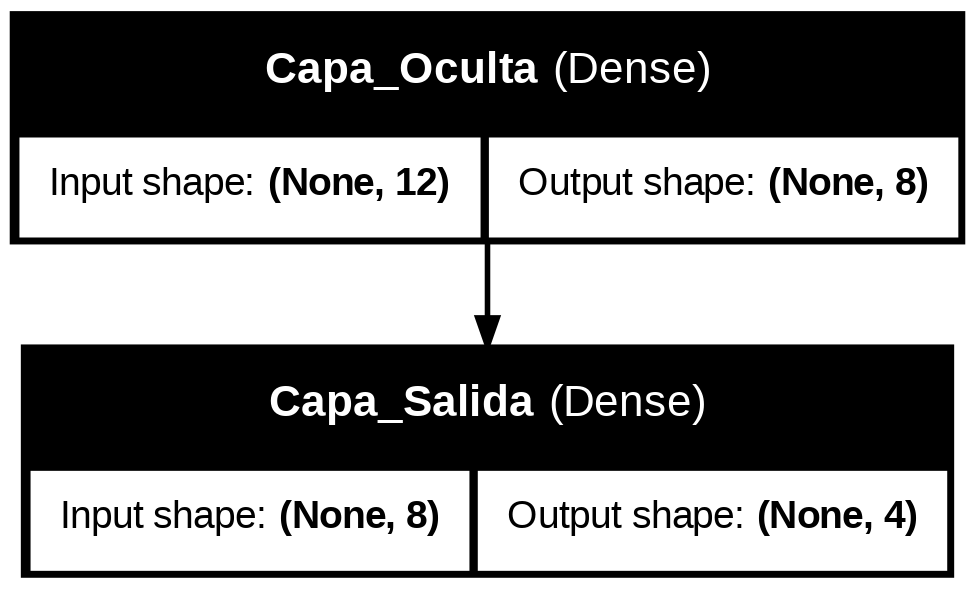

In [19]:
plot_model(mlp, show_shapes=True, show_layer_names=True)

In [20]:
history = mlp.fit(X_Train,
                  Y_Train,
                  validation_data=(X_Val, Y_Val),
                  batch_size=10,
                  epochs=25)

Epoch 1/25
864/864 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.4451 - loss: 11.2011 - val_accuracy: 0.7028 - val_loss: 0.8367
Epoch 2/25
864/864 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7176 - loss: 0.7223 - val_accuracy: 0.8500 - val_loss: 0.4081
Epoch 3/25
864/864 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.8517 - loss: 0.3955 - val_accuracy: 0.8639 - val_loss: 0.3211
Epoch 4/25
864/864 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8783 - loss: 0.3210 - val_accuracy: 0.8880 - val_loss: 0.2745
Epoch 5/25
864/864 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8955 - loss: 0.2794 - val_accuracy: 0.9111 - val_loss: 0.2450
Epoch 6/25
864/864 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9050 - loss: 0.2509 - val_accuracy: 0.9074 - val_loss: 0.2245
Epoch 7/25
864/864 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9132 - loss: 0.2305 - val_accuracy: 0.9102 - val_loss: 0.2092
Epoch 8/25
864/864 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9182 - loss: 0.2150 - val_accuracy: 0

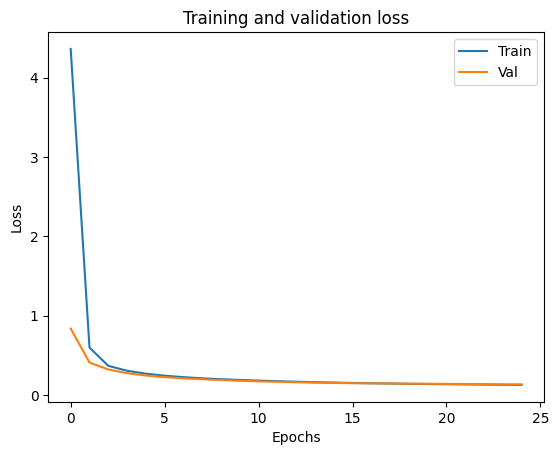

In [21]:
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Val')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

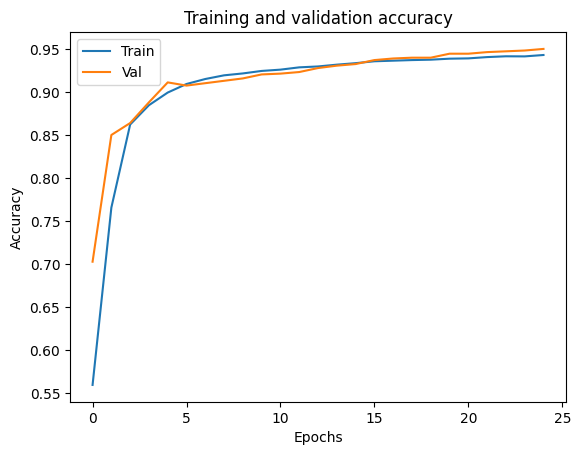

In [22]:
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [23]:
y_pred = mlp.predict(X_Test)
y_pred

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


array([[3.4319872e-30, 3.8577155e-06, 3.8715091e-03, 9.9612468e-01],
       [4.9817445e-32, 4.1945434e-05, 1.0469467e-02, 9.8948860e-01],
       [9.3756080e-01, 6.2439244e-02, 6.5424534e-25, 6.3865400e-16],
       ...,
       [8.1390654e-22, 6.0343630e-13, 4.6134330e-03, 9.9538648e-01],
       [7.8176798e-10, 9.8839700e-01, 1.1505794e-02, 9.7063756e-05],
       [8.3059747e-13, 9.9004787e-01, 8.0485102e-03, 1.9037400e-03]],
      dtype=float32)

In [24]:
print(Y_Test.shape)
print(y_pred.shape)
print(4)

(1080, 4)
(1080, 4)
4


In [25]:
y_test_labels = np.argmax(Y_Test, axis=1)
y_test_labels

array([3, 3, 0, ..., 3, 1, 1])

In [26]:
y_pred_labels = np.argmax(y_pred, axis=1)
y_pred_labels

array([3, 3, 0, ..., 3, 1, 1])

In [27]:
print(classification_report(y_test_labels, y_pred_labels,
                            target_names=['excellent', 'good', 'acceptable', 'spoiled'])
)

              precision    recall  f1-score   support

   excellent       0.97      1.00      0.98       166
        good       1.00      0.98      0.99       269
  acceptable       0.87      0.84      0.85       197
     spoiled       0.93      0.95      0.94       448

    accuracy                           0.94      1080
   macro avg       0.94      0.94      0.94      1080
weighted avg       0.94      0.94      0.94      1080



Confusion matrix, without normalization


<Axes: title={'center': 'Matriz de Confusión'}, xlabel='Predicted label', ylabel='True label'>

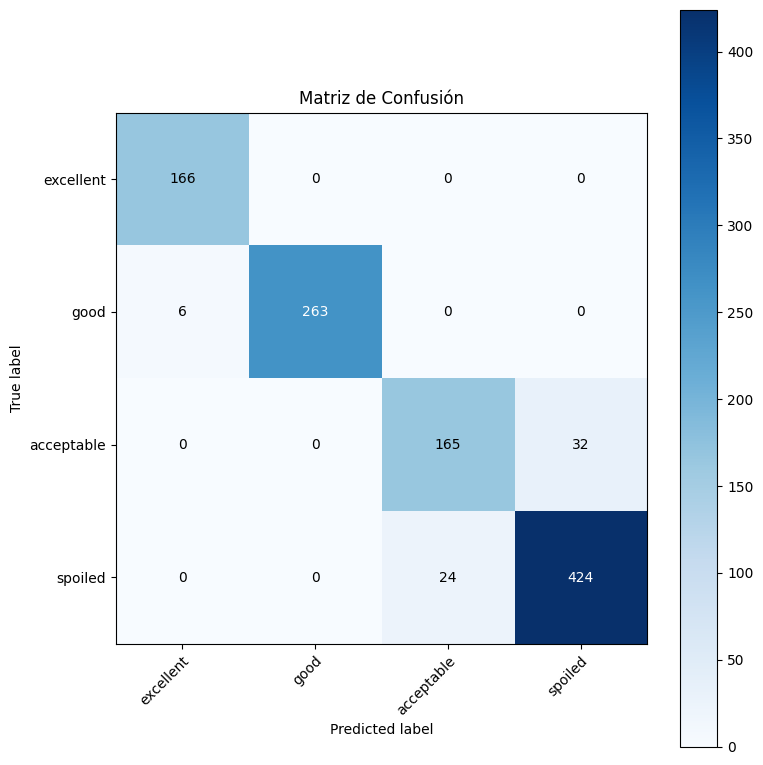

In [28]:
plot_confusion_matrix(y_true=y_test_labels, y_pred=y_pred_labels, classes=['excellent', 'good', 'acceptable', 'spoiled'],
                      title='Matriz de Confusión', size=(8, 8))

In [29]:
def build_mlp(hp):
  mlp = Sequential()
  # Especificamos el espacio de búsqueda para el número de neuronas por capa
  neurons = hp.Choice('neurons', [8, 10, 12, 25, 50])
  # Igualmente, especificamos el espacio de búsqueda para el número de capas ocultas
  layers = hp.Choice('layers', [1, 3, 5])

  mlp.add(Input(shape=INPUT_SHAPE, name='Capa_Entrada'))
  for i in range(layers):
    mlp.add(Dense(neurons,activation='relu',name=f'Capa_Oculta_{i+1}'))
  mlp.add(Dense(4,activation='softmax',name='Capa_Salida'))

  mlp.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
  mlp.summary()
  return mlp

In [30]:
tuner = kt.RandomSearch(
    build_mlp,
    objective="val_accuracy",
    seed=my_seed,
    max_trials=5
)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Capa_Oculta_1 (Dense)           │ (None, 8)              │           104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Capa_Salida (Dense)             │ (None, 4)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 140 (560.00 B)

 Trainable params: 140 (560.00 B)

 Non-trainable params: 0 (0.00 B)

In [31]:
tuner.search(X_Train,
             Y_Train,
             validation_data=(X_Val, Y_Val),
             batch_size=10,
             epochs=25
)

Trial 5 Complete [00h 01m 33s]
val_accuracy: 0.9768518805503845

Best val_accuracy So Far: 0.979629635810852
Total elapsed time: 00h 08m 38s


In [32]:
best_model = tuner.get_best_models()[0]

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Capa_Oculta_1 (Dense)           │ (None, 50)             │           650 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Capa_Oculta_2 (Dense)           │ (None, 50)             │         2,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Capa_Oculta_3 (Dense)           │ (None, 50)             │         2,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Capa_Oculta_4 (Dense)           │ (None, 50)             │         2,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Capa_Oculta_5 (Dense)           │ (None, 50)             │         2,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Capa_Salida (Dense)             │ (None, 4)              │           204 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,054 (43.18 KB)

 Trainable params: 11,054 (43.18 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 26 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [33]:
best_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Capa_Oculta_1 (Dense)           │ (None, 50)             │           650 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Capa_Oculta_2 (Dense)           │ (None, 50)             │         2,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Capa_Oculta_3 (Dense)           │ (None, 50)             │         2,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Capa_Oculta_4 (Dense)           │ (None, 50)             │         2,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Capa_Oculta_5 (Dense)           │ (None, 50)             │         2,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Capa_Salida (Dense)             │ (None, 4)              │           204 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,054 (43.18 KB)

 Trainable params: 11,054 (43.18 KB)

 Non-trainable params: 0 (0.00 B)

In [34]:
y_pred = best_model.predict(X_Test)
y_pred

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


array([[1.1607296e-08, 1.8742072e-05, 4.8054666e-03, 9.9517578e-01],
       [3.4360631e-10, 1.8922939e-06, 9.3061579e-05, 9.9990493e-01],
       [9.9376887e-01, 6.2037087e-03, 1.9043129e-05, 8.2965171e-06],
       ...,
       [2.1575836e-08, 1.4307668e-05, 2.3218140e-02, 9.7676754e-01],
       [2.3586267e-04, 9.5381337e-01, 4.5946464e-02, 4.3456480e-06],
       [1.8798214e-04, 9.9965286e-01, 1.5896096e-04, 1.9260294e-07]],
      dtype=float32)

In [35]:
print(Y_Test.shape)
print(y_pred.shape)
print(4)

(1080, 4)
(1080, 4)
4


In [36]:
y_test_labels = np.argmax(Y_Test, axis=1)
y_test_labels

array([3, 3, 0, ..., 3, 1, 1])

In [37]:
y_pred_labels = np.argmax(y_pred, axis=1)
y_pred_labels

array([3, 3, 0, ..., 3, 1, 1])

Confusion matrix, without normalization


<Axes: title={'center': 'Matriz de Confusión'}, xlabel='Predicted label', ylabel='True label'>

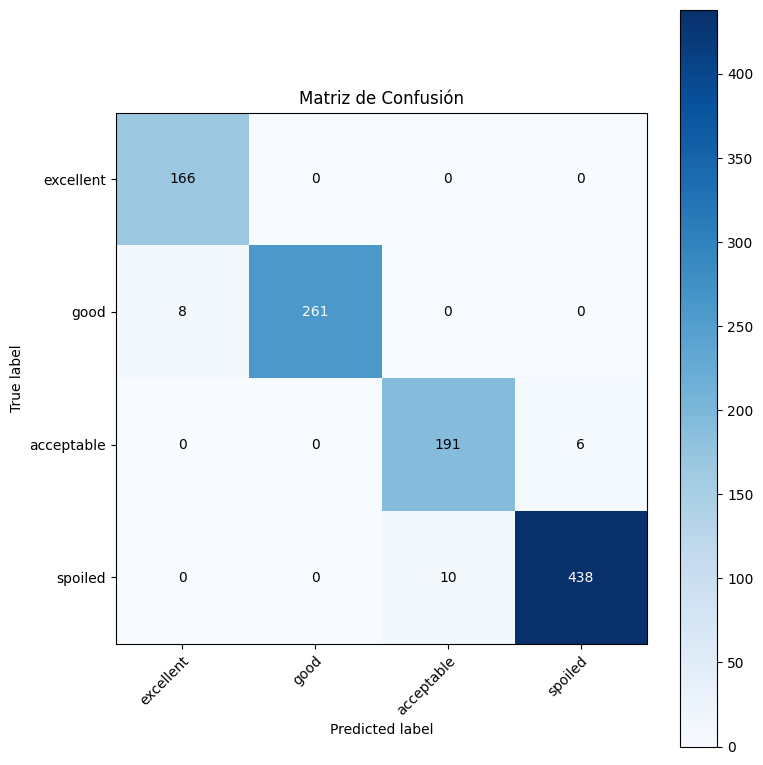

In [38]:
plot_confusion_matrix(y_true=y_test_labels, y_pred=y_pred_labels, classes=['excellent', 'good', 'acceptable', 'spoiled'],
                      title='Matriz de Confusión', size=(8, 8))

In [39]:
print(classification_report(y_test_labels, y_pred_labels,
                            target_names=['excellent', 'good', 'acceptable', 'spoiled'])
)

              precision    recall  f1-score   support

   excellent       0.95      1.00      0.98       166
        good       1.00      0.97      0.98       269
  acceptable       0.95      0.97      0.96       197
     spoiled       0.99      0.98      0.98       448

    accuracy                           0.98      1080
   macro avg       0.97      0.98      0.98      1080
weighted avg       0.98      0.98      0.98      1080



In [40]:
joblib.dump(best_model, 'Mejordt_modelo_entrenadoRedesNeuronales.joblib')

['Mejordt_modelo_entrenadoRedesNeuronales.joblib']

In [41]:
modelo = joblib.load('Mejordt_modelo_entrenadoRedesNeuronales.joblib')

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 26 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [45]:
testcosito = pd.read_csv('test.csv')
testcosito
testfinalnovamas = preprocess(testcosito)

<ipython-input-8-169799506f77>:6: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['class'] = df['class'].replace(class_labels)


In [47]:
result = modelo.predict(testfinalnovamas)


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [50]:
y_test_result_novamas = np.argmax(result, axis=1)
y_test_result_novamas

array([1, 3, 3, ..., 3, 1, 1])